# Object Detection Evaluation Template

## Introductory Notes

This notebook demonstrates how to do inference with our exported models and evaluate model performance based on metrics such as the mean average precision or confusion matrices.

The code in this notebook can be run either locally or on Google Colab. For local execution, the Object Detection API and a few standard modules need to be installed – see the README file in the project main directory for more detailed information. If using Colab, the notebook includes installation of all the necessary libraries, including the Object Detection API. 

The following files and modules from our project are used:

*   __models/fine-tuned__ – directory with saved models, here we only use our best performing model `efficient_det_1024_rand_aug_1_4`
*   __data/train-valid-split/label_map.pbtxt__ – the label map file that assigns numerical class IDs to class names; this has to be the same label map as used for training the evaluated model
*   __src/evaluation.py__ – this module contains functions used to evaluate the model
*   __src/visualize.py__ – this module contains functions to visualize different aspects of the evaluation

Assumed project structure:
```
main_project_dir/
├─ README.md                               
├─ generate-synthetic-images/              <- scripts to generate synthetic images 
├─ data/                  
│   ├─ test-annotated-images/              <- test images with xml annotations
│   ├─ synthetic-train-annotated-images/   <- synthetic images with xml annotations used for training 
│   ├─ test-google-images/                 <- a handful of images of other cabinets from Google search that we can use for final testing
│   ├─ train-valid-split
│   │    ├─ training/                      <- preprocessed training images with xml annotations
│   │    ├─ validation/                    <- preprocessed validation images with xml annotations
│   │    ├─ train.record                   <- TF .record file containing the training data
│   │    ├─ valid.record                   <- TF .record file containing the validation data
│   │    └─ label_map.pbtxt                <- label map file that maps class IDs to class names
├─ models/                              
│   ├─ pre-trained/                        <- pre-trained models downloaded from TF Object Detection Model Zoo
│   ├─ fine-tuned/                         <- fine-tuned models trained on the data in train-valid-split
├─ notebooks/                              <- notebooks used for training and evaluation
│   ├─ training.ipynb
│   ├─ training_validation.ipynb
│   └─ evaluation.ipynb
└─ src/                                    <- modules used in the notebooks
```

**NOTE**: When executing the code locally, it is assumed we are running from the notebooks folder, not the main project directory.

## Colab Initialization (skip if running locally)

In [1]:
from pathlib import Path
# main project directory
MAIN_DIR = Path("/content/gdrive/MyDrive/s2ds-aug2021-cv")
# location of TF Object Detection API
TF_DIR = MAIN_DIR/'tf-models'
# where to install additional python modules
INSTALL_DIR = MAIN_DIR/"colab-install"
INSTALL_SITE_DIR = INSTALL_DIR/"lib/python3.7/site-packages"

Mount Google Drive

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Init Google Cloud Storage (when using data/models stored on Cloud Storage)

In [ ]:
# from google.colab import auth
# auth.authenticate_user()
# !gcloud init

Clone the project directory 

In [3]:
if not MAIN_DIR.exists():
  !git clone --depth 1 https://github.com/sergekomarov/s2ds-aug2021-cv $MAIN_DIR

Install TF Object Detection API

In [4]:
import glob

if not TF_DIR.exists():
  !git clone --depth 1 https://github.com/tensorflow/models $TF_DIR

if len(glob.glob(str(INSTALL_SITE_DIR/'object_detection*')))==0:
  %cd {TF_DIR/'research'}
  !protoc object_detection/protos/*.proto --python_out=.
  !cp object_detection/packages/tf2/setup.py .
  !python setup.py build
  !python setup.py install --prefix=$INSTALL_DIR

Reinstall imgaug

In [5]:
if not (INSTALL_SITE_DIR/'imgaug').exists():
  !pip install git+https://github.com/aleju/imgaug.git --prefix=$INSTALL_DIR

Reinstall PIL

In [ ]:
!pip uninstall pillow
if not (INSTALL_SITE_DIR/"PIL").exists():
  !pip install pillow --prefix=$INSTALL_DIR

Update Python PATH with the previously installed (to Google Drive) packages  and go to the notebooks directory

In [6]:
%cd {MAIN_DIR}
from src.utils import add_pkgs_to_path
add_pkgs_to_path(str(INSTALL_SITE_DIR))
%cd notebooks

/content/gdrive/MyDrive/s2ds-aug2021-cv
/content/gdrive/MyDrive/s2ds-aug2021-cv/notebooks


## Setup

Set up directory structure, choose a model to be evaluated and data used for evaluation

In [7]:
import os
# Path to the exported model to be evaluated. Change to use another model. 
PATH_TO_MODEL = os.path.normpath('../models/fine-tuned/efficient_det_1024_rand_aug_1_4/exported')

# Label map used during training
PATH_TO_LABELMAP = os.path.normpath('../data/train-valid-split/label_map.pbtxt') 

# Path to the folder that contains images and their ground truth annotations used for evaluation. 
# Images (.jpg) and annotations (.xml) are expected to have the same names.
PATH_TO_TEST_IMG_DIR = os.path.normpath('../data/test-annotated-images')

# Path to the folder with a few images of other cabinets found on Google Search. 
# These can be used to check if the model generalises well.
PATH_TO_TEST_GOOGLE_IMG_DIR = os.path.normpath('../data/test-google-images')

Add the project main directory to Python PATH

In [8]:
import sys
sys.path.insert(0, os.path.abspath("..").replace('My Drive','MyDrive'))

Imports

In [9]:
import random
from pathlib import Path

# our modules in src/
from src.evaluation import *
import src.visualize

import warnings
# suppress Matplotlib warnings
warnings.filterwarnings('ignore')   
%matplotlib inline

## Load the model

To do inference on images, we first initialize our model from its `exported` folder.

__NOTE__: TensorFlow will output warnings when loading certain models, including EfficientDet. These can be safely ignored as we do not use custom gradients.

In [10]:
PATH_TO_SAVED_MODEL = os.path.join(PATH_TO_MODEL,'saved_model')
# Load the model and build the detection function
DETECT_FN = tf.saved_model.load(PATH_TO_SAVED_MODEL)

## Test data preprocessing

Our models are tuned to work with images of shape close to 1024x1024 due to the choice of our pre-trained model (EfficientDet D4). Thus, large images first need to be resized before being fed into the models.

In [11]:
# We will resize test images to this target size as part of preprocessing
TARGET_IMAGE_SIZE = 1024
# How we reshape input images (see below)
RESHAPE_FLAG = 'scale_min_and_crop'

We find that the models perform best on square images without padding. Because our test images are rectangular, we provide several options to reshape them:

1. **Resize images as to keep their aspect ratio**, so that the largest dimension becomes 1024. While this yields decent predictions, the other two approaches appear to be significantly superior

2. **Resize and stretch to squares.**
  While this approach gives very good results for our particular test set, we do not think this is a consistent way of making predictions for arbitrary aspect ratios in general.

3. **Resize and split rectangles into two squares.**
   First, resize by keeping the aspect ratio so that the short side becomes 1024. Then take two intersecting square crops (upper and lower for vertical images, left/right for horizontal), make predictions for both, and then join them together while removing any double detections. This works when the ratio of maximum to minimum image dimensions is less than 2. We have observed our models performed best on square crops, but the main downside is that inference now takes twice the amount of time for a single square image.

Based on these observations, we recommend to simply use square images when using the model at this point.



## Making predictions

We are now going to make predictions for images in a given folder. For that, we use the `detections_from_image_dir` function from `src.evaluation`. Below, we describe its arguments.

* __image_dir__: path to the input test images directory
* __detect_fn__: our detection model 
* __label_map_path__: path to the label map file that maps class IDs to class names
* __min_score_threshold__ (float): sets the minimum confidence score for the predictions to be retained
* __reshape__: flag that defines how we reshape test images
    * `stretch2square`: resize and stretch input images to shape (`target_size`,`target_size`) before feeding into the model;
    * `scale_max`: resize by keeping the aspect ratio so that the long side becomes `target_size`, then feed into the model;
    * `scale_min_and_crop`: resize by keeping the aspect ratio so that the short side becomes `target_size`, then, if the image is not a square already, split it into two square crops, make predictions for each of them, and join the predictions while removing duplicates.
* __target_size__ (int): sets the target size of images after resizing/reshaping as described above
* __only_top_left__ (bool): when `reshape=scale_min_and_crop` and images are cropped into squares, this allows us to keep only the upper (for vertical images) or left (for horizontal) crops for prediction. This is motivated by the fact that in all our test images both controllers are always either in the upper or left squares, so if we simply use squares docked to the top left of the images, we achive very similar results as when using the more complicated approach with separate detections for two squares. Clearly, this should be avoided in the general case.

Here we keep all the low confidence predictions by setting `min_score_threshold=0`. This will be required to calculate the COCO metrics for our predictions consistently.

In [12]:
detections_from_dir = detections_from_image_dir(
    image_dir = PATH_TO_TEST_IMG_DIR,
    detect_fn = DETECT_FN,
    target_size = TARGET_IMAGE_SIZE,
    label_map_path =  PATH_TO_LABELMAP,
    min_score_thresh = 0.,
    reshape = RESHAPE_FLAG,
    only_top_left = False
    )

100%|██████████| 57/57 [01:28<00:00,  1.55s/it]


The function returns a dictionary whose keys are the input image names, and the values are tuples of the numpy arrays extracted from the images and their prediction dictionaries:

In [13]:
detections_from_dir.keys()

dict_keys(['IMG_1354.jpg', 'IMG_1348.jpg', 'IMG_1347.jpg', 'IMG_1325.jpg', 'IMG_1246.jpg', 'IMG_1247.jpg', 'IMG_1344.jpg', 'IMG_1259.jpg', 'IMG_1339.jpg', 'IMG_1324.jpg', 'IMG_1342.jpg', 'IMG_1250.jpg', 'IMG_1337.jpg', 'IMG_1346.jpg', 'IMG_1349.jpg', 'IMG_1245.jpg', 'IMG_1345.jpg', 'IMG_1249.jpg', 'IMG_1279.jpg', 'IMG_1338.jpg', 'IMG_1343.jpg', 'IMG_1274.jpg', 'IMG_1326.jpg', 'IMG_1276.jpg', 'IMG_1258.jpg', 'IMG_1333.jpg', 'IMG_1281.jpg', 'IMG_1329.jpg', 'IMG_1273.jpg', 'IMG_1271.jpg', 'IMG_1330.jpg', 'IMG_1248.jpg', 'IMG_1280.jpg', 'IMG_1332.jpg', 'IMG_1340.jpg', 'IMG_1331.jpg', 'IMG_1272.jpg', 'IMG_1341.jpg', 'IMG_1275.jpg', 'IMG_1282.jpg', 'IMG_1351.jpg', 'IMG_1353.jpg', 'IMG_1350.jpg', 'IMG_1352.jpg', 'IMG_1244.jpg', 'IMG_1446.JPG', 'IMG_1450.JPG', 'IMG_1448.JPG', 'IMG_1447.JPG', 'IMG_1449.JPG', 'IMG_1452.JPG', 'IMG_1451.JPG', 'IMG_1454.JPG', 'IMG_1458.JPG', 'IMG_1455.JPG', 'IMG_1453.JPG', 'IMG_1456.JPG'])

In [14]:
type(detections_from_dir['IMG_1354.jpg'][0])

numpy.ndarray

In [15]:
detections_from_dir['IMG_1354.jpg'][1].keys()

dict_keys(['detection_boxes', 'detection_scores', 'detection_classes', 'num_detections'])

__NOTE 1__: The calculation of metrics done by the API requires an older version of Numpy (1.17) and may fail for newer version – see requirements.txt.

__NOTE 2__: If you encounter errors related to the PIL function ImageOps.exif_transpose, you might need to install the Pillow library version 8.3.1 (as listed in requirements.txt).

## Evaluation Metrics

We can now use the predicted detections to evaluate our model using several performance metrics. 

To evaluate, we need to compare our predictions with the ground truth annotations that show the actual classes and bounding boxes of objects in the test images. To annotate the test images, we use LabelImg and save the annotations in the Pascal VOC format: for each image, there is an XML annotation file with the same name as the image.

We choose to keep the XML annotations in the same folder as the test images, `PATH_TO_TEST_IMG_DIR`.

### 1) COCO Performance Metrics

We can obtain the COCO metrics for our detections using `src.evaluation.get_coco_metrics`. The following code employs the Object Detection API to calculate several standard metrics for object detection – see e.g. https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173 for details.

The first argument of the function specifies the directory with the ground truth XML annotations (same as the test image folder in our case). The second argument is the detection dictionary with our predictions obtained previously. The function also needs to know the path to the label map file, as well as the preprocessing options discussed before (in order to adjust the annotations correspondingly).

In addition, the option __include_metrics_per_category__ may be set to True to calculate all metrics for each class separately before calculating the overall average.



In [16]:
get_coco_metrics(PATH_TO_TEST_IMG_DIR, detections_from_dir,
                 PATH_TO_LABELMAP,
                 target_size = TARGET_IMAGE_SIZE,
                 reshape = RESHAPE_FLAG,
                 include_metrics_per_category = False)

creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.19s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.474
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.787
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.522
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.464
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.701
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.526
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.540
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.546
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.

{'DetectionBoxes_Precision/mAP': 0.47402097070884847,
 'DetectionBoxes_Precision/mAP (large)': 0.700990099009901,
 'DetectionBoxes_Precision/mAP (medium)': 0.4640867846881755,
 'DetectionBoxes_Precision/mAP (small)': -1.0,
 'DetectionBoxes_Precision/mAP@.50IOU': 0.7873740571052648,
 'DetectionBoxes_Precision/mAP@.75IOU': 0.522230903121601,
 'DetectionBoxes_Recall/AR@1': 0.5256041046011254,
 'DetectionBoxes_Recall/AR@10': 0.5396226415094338,
 'DetectionBoxes_Recall/AR@100': 0.5462264150943396,
 'DetectionBoxes_Recall/AR@100 (large)': 0.7,
 'DetectionBoxes_Recall/AR@100 (medium)': 0.5402673796791444,
 'DetectionBoxes_Recall/AR@100 (small)': -1.0}

If actual detection is more important than precise localisation and placement of bounding boxes, the more important metric is mAP at 0.5 IoU. The IoU threshold (intersection over union) characterises how much our predicted bounding boxes need to intersect with the annotated ones (ground truth) to treat detections as valid.

Nevertheless, our model also achieves a decent mAP at 0.75 IoU, as well as the COCO mAP score averaged across the range of 0.5 to 0.95 IoU.

__NOTE__: A '-1.0' indicates that the API could not calculate this category for the given test images, e.g. there are no 'small' objects in the dataset.

### 2) Custom Metrics for Confusion Matrices

Alternatively, we can use `src.evaluation.get_metrics` to calculate the mAP score at an arbitrary IoU threshold and, in addition to that, count the numbers of true positive, false positive, and false negative detections to plot confusion matrices.

The function takes the same first three arguments as `src.get_coco_metrics`. The rest are
* __iou_thresh__ can be set to decide on how well the predicted bounding boxes need to overlap with the ground truth boxes to count predictions as true positives;
* __min_score_thresh__ sets the minimum confidence score to accept predictions. It regulates the balance between the numbers of false positive and false negative detections: the higher it is, the less FP and more FN we have, and vice versa.


In [17]:
MIN_SCORE_THRESH = 0.9
IOU_THRESH = 0.5

In [18]:
confMetrics = get_metrics(PATH_TO_TEST_IMG_DIR,
                          detections_from_dir,
                          PATH_TO_LABELMAP,
                          min_score_thresh = MIN_SCORE_THRESH,
                          iou_thresh = IOU_THRESH)

100%|██████████| 57/57 [00:00<00:00, 293.09it/s]


The function returns a dictionary containing the average precision and numbers of true positives, false positives and false negatives per class. We can display them nicely formatted using `src.visualize.print_metrics`:

In [19]:
src.visualize.print_metrics(confMetrics,
                            PATH_TO_TEST_IMG_DIR,
                            PATH_TO_LABELMAP,
                            min_score_thresh = MIN_SCORE_THRESH,
                            iou_thresh = IOU_THRESH)

Metrics when evaluated on images in ../data/test-annotated-images at minimal score 0.9 and IoU threshold 0.5:

AllenBradley AP:  0.9208
AllenBradley Prediction Types: 	53 True Positives,
				0 False Positives (nothing there),
				0 False Positives (mistaken Siemens),
				4 False Negatives,
Siemens AP:  0.5842
Siemens Prediction Types: 	31 True Positives,
				0 False Positives (nothing there),
				0 False Positives (mistaken AllenBradley),
				22 False Negatives,
Total Precision: 1.0
Total Recall: 0.7636
F-Score: 0.866
mAP: 0.7525


**NOTE**: Here the mAP score is slightly lower than the COCO mAP. This is because now we are filtering predictions by confidence level. By setting `MIN_SCORE_THRESH=0`, one can observe full agreement between the output of our function and the COCO metrics.

We can also draw the confusion matrix (set save = 'path/confusion_matrix.png' to also save this image):

<Figure size 720x504 with 0 Axes>

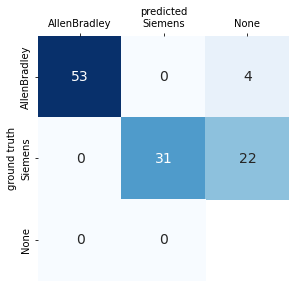

In [20]:
src.visualize.plot_detection_confusion_matrix(confMetrics,
                                              PATH_TO_LABELMAP,
                                              #title='EfficientDet 1024 RandAug 1.4',
                                              rotate_label = 90,
                                              save = None)

We notice that reducing `MIN_SCORE_THRESH` from 0.9 increases the number of FP Siemens controllers, however the number of FN Siemens detections stays almost the same. This motivates us to use a higher `MIN_SCORE_THRESH`. Such behaviour can be explained by visual assessment of our predictions: it turns out that most FN detections are due to obscuration by cables or very oblique camera angles – things that can not be alleviated by lowering the detection threshold.


## Visual Evaluation

### Test images: High Bay Cabinet

Let us now assess our predictions visually by plotting the test images with the predicted bounding boxes overlaid.

First, choose a random subset of images to plot. Note that we only need image names, not paths, as the names are used to index our predictions dictionary `detections_from_dir`.  

In [21]:
# using all the 57 images here
NUM_IMG_PLOT = 57
NUM_IMG_ROW = 3

In [22]:
image_names = [x for x in os.listdir(PATH_TO_TEST_IMG_DIR) if '.jpg' in x or '.JPG' in x]
images_to_plot = sorted(random.sample(image_names, NUM_IMG_PLOT))

To plot predictions, we use `src.visualize.plot_predictions_from_paths`, which takes `detections_from_dir` and the chosen image names `images_to_plot` used to index the detections dictionary. The function also provides several options:
* __min_score_thresh__: only draw boxes with a detection score bigger than this threshold;
* __img_per_row__: how many images to plot per row;
* __linewidth__: line width of the bounding boxes.

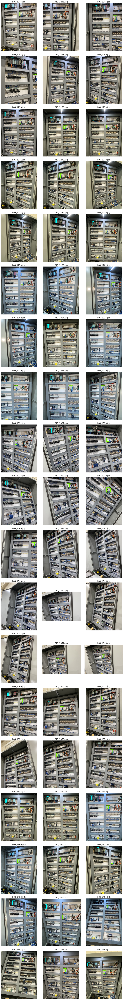

In [23]:
src.visualize.plot_predictions_from_paths(
    images_to_plot,
    detections_from_dir,
    PATH_TO_LABELMAP,
    min_score_thresh=0.9,
    img_per_row = NUM_IMG_ROW,
    linewidth = 8)

We see that our face-on predictions are close to perfect, and the model fails only when the objects are obscured by cables or seen at oblique angles. This is the source or false negative detections in the confusion matrix.

We can also save these plots in high resolution to a target directory `target_dir` using `src.visualize.save_predictions`:

In [24]:
TARGET_DIR = 'evaluation-images'
if not Path(TARGET_DIR).exists():
    Path(TARGET_DIR).mkdir()
src.visualize.save_predictions(
                 TARGET_DIR,
                 images_to_plot,
                 detections_from_dir,
                 PATH_TO_LABELMAP,
                 min_score_thresh = MIN_SCORE_THRESH,
                 linewidth = 7
                )

### Test images: other cabinets from Google Search

Finally, let us try to do inference on a few Google images of other cabinets that contain the same controllers.

In [25]:
detections_from_dir_google = detections_from_image_dir(
    image_dir = PATH_TO_TEST_GOOGLE_IMG_DIR,
    detect_fn = DETECT_FN,
    target_size = TARGET_IMAGE_SIZE,
    label_map_path =  PATH_TO_LABELMAP,
    min_score_thresh = 0.,
    reshape = RESHAPE_FLAG,
    only_top_left = False
    )

100%|██████████| 6/6 [00:04<00:00,  1.28it/s]


In [26]:
google_images_to_plot = [x for x in os.listdir(PATH_TO_TEST_GOOGLE_IMG_DIR) if '.jpg' in x or '.JPG' in x]

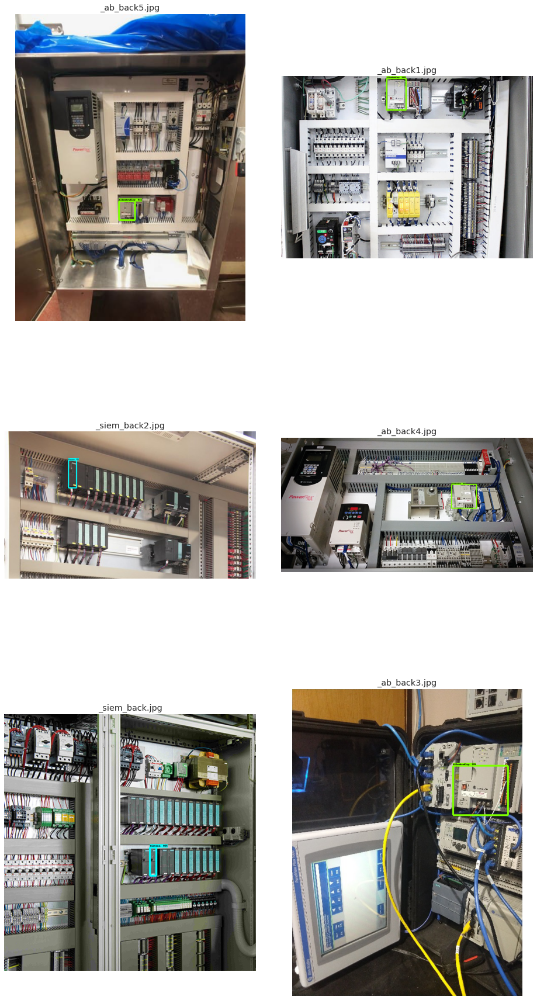

In [27]:
src.visualize.plot_predictions_from_paths(
    google_images_to_plot,
    detections_from_dir_google,
    PATH_TO_LABELMAP,
    min_score_thresh=0.9,
    img_per_row = 2,
    linewidth = 8)

Even though these images have rather low resolution, we can still make several positive conclusions about the model:
* We can clearly detect the Allen Bradley consistently, even though the bounding box around the large AB in _ab_back3.jpg is not very precise, probably because we have mostly used smaller scales for training.
* It is impressive how the model finds the right Siemens in _siem_back2.jpg, even though there are many other similar black boxes around. 
* In _siem_back.jpg, the model does not see the second Siemens right next to the one detected.
